In [1]:
!pip install xmltodict

You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [2]:
import xml.etree.ElementTree as ET
import xmltodict
import collections
import torch
from PIL import Image
import torchvision.transforms.functional as TF
from torchvision import transforms, models
import numpy as np # linear algebra
import random
import math
import matplotlib.pyplot as plt
import os
import glob
import time
import copy

img_h = 448
img_w = 448

seed = int(time.time()%1000 + 256*time.time()%(time.time()) + (1024^int(time.time()))*(1256-time.time()))%1000
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

mean=[0.485, 0.456, 0.406]
std=[0.229, 0.224, 0.225]

seed
cont_train = False

#108 grad_levels(CURRENTLY 70)

In [3]:
import shutil 
from tqdm import tqdm

train_dir = 'train'
val_dir = 'val'
test_dir = 'test'

for dir_name in [train_dir, val_dir, test_dir]:
    os.makedirs(os.path.join(dir_name, 'unknown'), exist_ok=True)
source_dir  = os.path.join("../input/dog-and-cat-detection/images/")
for i, file_name in enumerate(tqdm(os.listdir(source_dir))):
    if i % 41 == 0:
        dest_dir = os.path.join(test_dir)
    elif i % 17 != 0:
        dest_dir  = os.path.join(train_dir)
    else:
        dest_dir  = os.path.join(val_dir)
    shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_dir, 'unknown', file_name))

100%|██████████| 3686/3686 [00:34<00:00, 107.73it/s]


In [4]:
class FaceMaskDataset(torch.utils.data.Dataset):
    def __init__(self, image_paths, S=7, B=2, C=20, train=True):
        self.image_paths = image_paths
        self.S = S
        self.B = B
        self.C = C
        
    def transform(self, image, boxes, index):
        # Resize
        resize = transforms.Resize(size=(img_h, img_w))
        image = resize(image)
        if self.image_paths[index][:3] != "val" and self.image_paths[index][:4] != "test":
            if random.random() > 0.5:
                image = TF.hflip(image)
                for box in boxes:
                    box[1] = 1- box[1]
            jitter = transforms.ColorJitter(brightness=0.4, contrast=0.5, saturation=0.3, hue=0.4)
            image = jitter(image)
                             
        # Transform to tensor
        image = TF.to_tensor(image)
        image = TF.normalize(image, 0, 1)
        return image, boxes

    def __getitem__(self, index):
        image = Image.open(self.image_paths[index]).convert('RGB')
        boxes = []

        if self.image_paths[index][:3] == "val":
            name = self.image_paths[index][12:-3]
        elif self.image_paths[index][:4] == "test":
            name = self.image_paths[index][13:-3]
        else:
            name = self.image_paths[index][14:-3]
        tree = ET.parse("../input/dog-and-cat-detection/annotations/" + name + "xml")

        root = tree.getroot()
        xmlstr = ET.tostring(root, encoding='utf8', method='xml')
        xml_dict = (xmltodict.parse(xmlstr))
        width_img = int(xml_dict['annotation']['size']['width'])
        height_img = int(xml_dict['annotation']['size']['height'])
        if type(xml_dict['annotation']['object']) is list:
            for obj in xml_dict['annotation']['object']:
                xmin = int(obj['bndbox']['xmin'])/width_img
                ymin = int(obj['bndbox']['ymin'])/height_img
                xmax = int(obj['bndbox']['xmax'])/width_img
                ymax = int(obj['bndbox']['ymax'])/height_img
                
                width  = xmax - xmin
                height = ymax - ymin
                xfullc = xmin + (width/2)
                yfullc = ymin + (height/2)
                if obj['name'] == 'cat': class_label = 0
                else: class_label = 1
                
                boxes.append([class_label, xfullc, yfullc, width, height])
        else:
                xmin = int(xml_dict['annotation']['object']['bndbox']['xmin'])/width_img
                ymin = int(xml_dict['annotation']['object']['bndbox']['ymin'])/height_img
                xmax = int(xml_dict['annotation']['object']['bndbox']['xmax'])/width_img
                ymax = int(xml_dict['annotation']['object']['bndbox']['ymax'])/height_img
                
                width  = xmax - xmin
                height = ymax - ymin
                xfullc = xmin + (width/2)
                yfullc = ymin + (height/2)
                if xml_dict['annotation']['object']['name'] == 'cat': class_label = 0
                else: class_label = 1
                
                boxes.append([class_label, xfullc, yfullc, width, height])
                
        boxes = torch.tensor(boxes)
        image, boxes = self.transform(image, boxes, index)

        # Convert To Cells
        label_matrix = torch.zeros((self.S, self.S, self.C + 5 * self.B))
        for box in boxes:
            class_label, x, y, width, height = box.tolist()
            class_label = int(class_label)

            # i,j represents the cell row and cell column
            i, j = int(self.S * y), int(self.S * x)
            x_cell, y_cell = self.S * x - j, self.S * y - i

            """
            Calculating the width and height of cell of bounding box,
            relative to the cell is done by the following, with
            width as the example:
            
            width_pixels = (width*self.image_width)
            cell_pixels = (self.image_width)
            
            Then to find the width relative to the cell is simply:
            width_pixels/cell_pixels, simplsification leads to the
            formulas below.
            """
            width_cell, height_cell = (
                width * self.S,
                height * self.S,
            )

            # If no object already found for specific cell i,j
            # Note: This means we restrict to ONE object
            # per cell!
            if label_matrix[i, j, 2] == 0:
                # Set that there exists an object
                label_matrix[i, j, 2] = 1

                # Box coordinates
                box_coordinates = torch.tensor(
                    [x_cell, y_cell, width_cell, height_cell]
                )

                label_matrix[i, j, 3:7] = box_coordinates

                # Set one hot encoding for class_label
                label_matrix[i, j, class_label] = 1

        return image, label_matrix

    def __len__(self):
        return len(self.image_paths)

In [5]:
train_data = glob.glob('train/unknown/*.png')

val_data = glob.glob('val/unknown/*.png')

test_data = glob.glob('test/unknown/*.png')

train_dataset = FaceMaskDataset(sorted(train_data), C=2)
val_dataset = FaceMaskDataset(sorted(val_data), C=2)
test_dataset = FaceMaskDataset(sorted(test_data), C=2)

batch_size = 35
train_dataloader = torch.utils.data.DataLoader(
    train_dataset, batch_size=batch_size, shuffle=True, num_workers=batch_size, drop_last=True
)

val_dataloader = torch.utils.data.DataLoader(
    val_dataset, batch_size=35, shuffle=True, num_workers=batch_size
)

test_dataloader = torch.utils.data.DataLoader(
    test_dataset, batch_size=8, shuffle=True, num_workers=batch_size, drop_last=True
)

In [6]:
def convert_cellboxes(predictions, S=7):
    """
    Converts bounding boxes output from Yolo with
    an image split size of S into entire image ratios
    rather than relative to cell ratios. Tried to do this
    vectorized, but this resulted in quite difficult to read
    code... Use as a black box? Or implement a more intuitive,
    using 2 for loops iterating range(S) and convert them one
    by one, resulting in a slower but more readable implementation.
    """

    predictions = predictions.to("cpu")
    batch_size = predictions.shape[0]
    predictions = predictions.reshape(batch_size, 7, 7, 12)
    bboxes1 = predictions[..., 3:7]
    bboxes2 = predictions[..., 8:12]
    scores = torch.cat(
        (predictions[..., 3].unsqueeze(0), predictions[..., 8].unsqueeze(0)), dim=0
    )
    best_box = scores.argmax(0).unsqueeze(-1)
    best_boxes = bboxes1 * (1 - best_box) + best_box * bboxes2
    cell_indices = torch.arange(7).repeat(batch_size, 7, 1).unsqueeze(-1)
    x = 1 / S * (best_boxes[..., :1] + cell_indices)
    y = 1 / S * (best_boxes[..., 1:2] + cell_indices.permute(0, 2, 1, 3))
    w_y = 1 / S * best_boxes[..., 2:4]
    converted_bboxes = torch.cat((x, y, w_y), dim=-1)
    predicted_class = predictions[..., :2].argmax(-1).unsqueeze(-1)
    best_confidence = torch.max(predictions[..., 2], predictions[..., 7]).unsqueeze(
        -1
    )
    converted_preds = torch.cat(
        (predicted_class, best_confidence, converted_bboxes), dim=-1
    )

    return converted_preds


def cellboxes_to_boxes(out, S=7):
    converted_pred = convert_cellboxes(out).reshape(out.shape[0], S * S, -1)
    converted_pred[..., 0] = converted_pred[..., 0].long()
    all_bboxes = []

    for ex_idx in range(out.shape[0]):
        bboxes = []

        for bbox_idx in range(S * S):
            bboxes.append([x.item() for x in converted_pred[ex_idx, bbox_idx, :]])
        all_bboxes.append(bboxes)

    return all_bboxes

In [7]:
model = models.resnet34(pretrained=True)

for par in model.parameters():
    par.requires_grad = False
class ConvBlock(torch.nn.Module):
    def __init__(self, in_channels, out_channels, **kwargs):
        super(ConvBlock, self).__init__()
        self.seq0 = torch.nn.Sequential(
            torch.nn.Conv2d(in_channels, out_channels//2, 1),
            torch.nn.Conv2d(out_channels//2, out_channels//2, 3, padding=1, bias=False),
            torch.nn.BatchNorm2d(out_channels//2),
            torch.nn.LeakyReLU(),
            torch.nn.Conv2d(out_channels//2, out_channels//2, 3, padding=1, bias=False),
            torch.nn.BatchNorm2d(out_channels//2),
            torch.nn.LeakyReLU(),
            torch.nn.Dropout2d(0.5),
            torch.nn.Conv2d(out_channels//2, out_channels, 3, padding=1, bias=False),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.LeakyReLU(),
            torch.nn.Conv2d(out_channels, out_channels, 3, padding=1, bias=False),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.LeakyReLU(),
            torch.nn.Conv2d(out_channels, out_channels, 1)
        )
    def forward(self, x):
        return self.seq0(x)
class AddConvBlock(torch.nn.Module):
    def __init__(self, in_channels, out_channels, **kwargs):
        super(AddConvBlock, self).__init__()
        self.seq0 = torch.nn.Sequential(
            torch.nn.Conv2d(in_channels, out_channels//2, 1),
            torch.nn.Conv2d(out_channels//2, out_channels//2, 3, padding=1, bias=False),
            torch.nn.BatchNorm2d(out_channels//2),
            torch.nn.LeakyReLU(),
            torch.nn.Conv2d(out_channels//2, out_channels//2, 3, padding=1, bias=False),
            torch.nn.BatchNorm2d(out_channels//2),
            torch.nn.LeakyReLU(),
            torch.nn.Conv2d(out_channels//2, out_channels, 3, padding=1, bias=False),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.LeakyReLU(),
            torch.nn.Conv2d(out_channels, out_channels, 3, padding=1, bias=False),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.LeakyReLU(),
            torch.nn.Conv2d(out_channels, out_channels, 1)
        )
    def forward(self, x):
        return self.seq0(x)
class resolonet(torch.nn.Module):
    def __init__(self, S=7, B=2, C=20):
        super(resolonet, self).__init__()
        self.seq0 = torch.nn.Sequential(
            *(list(model.children())[:-2])
        )
        self.seq1 = torch.nn.Sequential(
            AddConvBlock(512, 512),
            ConvBlock(512, 256)
        )
        self.fcs = torch.nn.Sequential(
            nn.AvgPool2d(7, 7),
            nn.Flatten(),
            nn.Linear(256*2*2, 1024), # Original paper this should be 4096
            nn.Dropout(0.4),
            nn.LeakyReLU(0.1),
            nn.Linear(1024, S*S*(C+B*5)), # (S, S, 30) C+B*5 = 30
        )
    def forward(self, x):
        return self.fcs(self.seq1(self.seq0(x)))

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth


  0%|          | 0.00/83.3M [00:00<?, ?B/s]

In [8]:
'''
for imgs, labels in val_dataloader:
    res_boxes = cellboxes_to_boxes(labels)
    for idx in range(imgs.shape[0]):
            nms_boxes = non_max_suppression(
                res_boxes[idx],
                iou_threshold=0.6,
                threshold=0.7,
                box_format='midpoint',
            )
            plot_image(imgs[idx].permute(1,2,0).to("cpu"), nms_boxes)
            print(nms_boxes)
        
    break
'''

'\nfor imgs, labels in val_dataloader:\n    res_boxes = cellboxes_to_boxes(labels)\n    for idx in range(imgs.shape[0]):\n            nms_boxes = non_max_suppression(\n                res_boxes[idx],\n                iou_threshold=0.6,\n                threshold=0.7,\n                box_format=\'midpoint\',\n            )\n            plot_image(imgs[idx].permute(1,2,0).to("cpu"), nms_boxes)\n            print(nms_boxes)\n        \n    break\n'

In [9]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from collections import Counter

def intersection_over_union(boxes_preds, boxes_labels, box_format="midpoint"):
    """
    Calculates intersection over union
    Parameters:
        boxes_preds (tensor): Predictions of Bounding Boxes (BATCH_SIZE, 4)
        boxes_labels (tensor): Correct labels of Bounding Boxes (BATCH_SIZE, 4)
        box_format (str): midpoint/corners, if boxes (x,y,w,h) or (x1,y1,x2,y2)
    Returns:
        tensor: Intersection over union for all examples
    """

    if box_format == "midpoint":
        box1_x1 = boxes_preds[..., 0:1] - boxes_preds[..., 2:3] / 2
        box1_y1 = boxes_preds[..., 1:2] - boxes_preds[..., 3:4] / 2
        box1_x2 = boxes_preds[..., 0:1] + boxes_preds[..., 2:3] / 2
        box1_y2 = boxes_preds[..., 1:2] + boxes_preds[..., 3:4] / 2
        box2_x1 = boxes_labels[..., 0:1] - boxes_labels[..., 2:3] / 2
        box2_y1 = boxes_labels[..., 1:2] - boxes_labels[..., 3:4] / 2
        box2_x2 = boxes_labels[..., 0:1] + boxes_labels[..., 2:3] / 2
        box2_y2 = boxes_labels[..., 1:2] + boxes_labels[..., 3:4] / 2

    if box_format == "corners":
        box1_x1 = boxes_preds[..., 0:1]
        box1_y1 = boxes_preds[..., 1:2]
        box1_x2 = boxes_preds[..., 2:3]
        box1_y2 = boxes_preds[..., 3:4]  # (N, 1)
        box2_x1 = boxes_labels[..., 0:1]
        box2_y1 = boxes_labels[..., 1:2]
        box2_x2 = boxes_labels[..., 2:3]
        box2_y2 = boxes_labels[..., 3:4]

    x1 = torch.max(box1_x1, box2_x1)
    y1 = torch.max(box1_y1, box2_y1)
    x2 = torch.min(box1_x2, box2_x2)
    y2 = torch.min(box1_y2, box2_y2)

    # .clamp(0) is for the case when they do not intersect
    intersection = (x2 - x1).clamp(0) * (y2 - y1).clamp(0)

    box1_area = abs((box1_x2 - box1_x1) * (box1_y2 - box1_y1))
    box2_area = abs((box2_x2 - box2_x1) * (box2_y2 - box2_y1))

    return intersection / (box1_area + box2_area - intersection + 1e-6)


def non_max_suppression(bboxes, iou_threshold, threshold, box_format="corners"):
    """
    Does Non Max Suppression given bboxes
    Parameters:
        bboxes (list): list of lists containing all bboxes with each bboxes
        specified as [class_pred, prob_score, x1, y1, x2, y2]
        iou_threshold (float): threshold where predicted bboxes is correct
        threshold (float): threshold to remove predicted bboxes (independent of IoU) 
        box_format (str): "midpoint" or "corners" used to specify bboxes
    Returns:
        list: bboxes after performing NMS given a specific IoU threshold
    """

    assert type(bboxes) == list

    bboxes = [box for box in bboxes if box[1] > threshold]
    bboxes = sorted(bboxes, key=lambda x: x[1], reverse=True)
    bboxes_after_nms = []

    while bboxes:
        chosen_box = bboxes.pop(0)

        bboxes = [
            box
            for box in bboxes
            if box[0] != chosen_box[0]
            or intersection_over_union(
                torch.tensor(chosen_box[2:]),
                torch.tensor(box[2:]),
                box_format=box_format,
            )
            < iou_threshold
        ]

        bboxes_after_nms.append(chosen_box)

    return bboxes_after_nms


def mean_average_precision(
    pred_boxes, true_boxes, iou_threshold=0.5, box_format="midpoint", num_classes=20
):
    """
    Calculates mean average precision 
    Parameters:
        pred_boxes (list): list of lists containing all bboxes with each bboxes
        specified as [train_idx, class_prediction, prob_score, x1, y1, x2, y2]
        true_boxes (list): Similar as pred_boxes except all the correct ones 
        iou_threshold (float): threshold where predicted bboxes is correct
        box_format (str): "midpoint" or "corners" used to specify bboxes
        num_classes (int): number of classes
    Returns:
        float: mAP value across all classes given a specific IoU threshold 
    """

    # list storing all AP for respective classes
    average_precisions = []

    # used for numerical stability later on
    epsilon = 1e-6

    for c in range(num_classes):
        detections = []
        ground_truths = []

        # Go through all predictions and targets,
        # and only add the ones that belong to the
        # current class c
        for detection in pred_boxes:
            if detection[1] == c:
                detections.append(detection)

        for true_box in true_boxes:
            if true_box[1] == c:
                ground_truths.append(true_box)

        # find the amount of bboxes for each training example
        # Counter here finds how many ground truth bboxes we get
        # for each training example, so let's say img 0 has 3,
        # img 1 has 5 then we will obtain a dictionary with:
        # amount_bboxes = {0:3, 1:5}
        amount_bboxes = Counter([gt[0] for gt in ground_truths])

        # We then go through each key, val in this dictionary
        # and convert to the following (w.r.t same example):
        # ammount_bboxes = {0:torch.tensor[0,0,0], 1:torch.tensor[0,0,0,0,0]}
        for key, val in amount_bboxes.items():
            amount_bboxes[key] = torch.zeros(val)

        # sort by box probabilities which is index 2
        detections.sort(key=lambda x: x[2], reverse=True)
        TP = torch.zeros((len(detections)))
        FP = torch.zeros((len(detections)))
        total_true_bboxes = len(ground_truths)
        
        # If none exists for this class then we can safely skip
        if total_true_bboxes == 0:
            continue

        for detection_idx, detection in enumerate(detections):
            # Only take out the ground_truths that have the same
            # training idx as detection
            ground_truth_img = [
                bbox for bbox in ground_truths if bbox[0] == detection[0]
            ]

            num_gts = len(ground_truth_img)
            best_iou = 0

            for idx, gt in enumerate(ground_truth_img):
                iou = intersection_over_union(
                    torch.tensor(detection[3:]),
                    torch.tensor(gt[3:]),
                    box_format=box_format,
                )

                if iou > best_iou:
                    best_iou = iou
                    best_gt_idx = idx

            if best_iou > iou_threshold:
                # only detect ground truth detection once
                if amount_bboxes[detection[0]][best_gt_idx] == 0:
                    # true positive and add this bounding box to seen
                    TP[detection_idx] = 1
                    amount_bboxes[detection[0]][best_gt_idx] = 1
                else:
                    FP[detection_idx] = 1

            # if IOU is lower then the detection is a false positive
            else:
                FP[detection_idx] = 1

        TP_cumsum = torch.cumsum(TP, dim=0)
        FP_cumsum = torch.cumsum(FP, dim=0)
        recalls = TP_cumsum / (total_true_bboxes + epsilon)
        precisions = torch.divide(TP_cumsum, (TP_cumsum + FP_cumsum + epsilon))
        precisions = torch.cat((torch.tensor([1]), precisions))
        recalls = torch.cat((torch.tensor([0]), recalls))
        # torch.trapz for numerical integration
        average_precisions.append(torch.trapz(precisions, recalls))

    return sum(average_precisions) / len(average_precisions)


def plot_image(image, boxes):
    """Plots predicted bounding boxes on the image"""
    im = np.array(image)
    height, width, _ = im.shape

    # Create figure and axes
    fig, ax = plt.subplots(1)
    # Display the image
    ax.imshow(im)

    # box[0] is x midpoint, box[2] is width
    # box[1] is y midpoint, box[3] is height

    # Create a Rectangle potch
    for box in boxes:
        edgecolor = "r" if box[0] == 0 else "g"
        box = box[2:]
        assert len(box) == 4, "Got more values than in x, y, w, h, in a box!"
        upper_left_x = box[0] - box[2] / 2
        upper_left_y = box[1] - box[3] / 2
        rect = patches.Rectangle(
            (upper_left_x * width, upper_left_y * height),
            box[2] * width,
            box[3] * height,
            linewidth=3,
            edgecolor=edgecolor,
            facecolor="none",
        )
        # Add the patch to the Axes
        ax.add_patch(rect)

    plt.show()

In [10]:
import torch.nn as nn
class YoloLoss(nn.Module):
    """
    Calculate the loss for yolo (v1) model
    """

    def __init__(self, S=7, B=2, C=20):
        super(YoloLoss, self).__init__()
        self.mse = nn.MSELoss(reduction="sum")

        """
        S is split size of image (in paper 7),
        B is number of boxes (in paper 2),
        C is number of classes (in paper and VOC dataset is 20),
        """
        self.S = S
        self.B = B
        self.C = C

        # These are from Yolo paper, signifying how much we should
        # pay loss for no object (noobj) and the box coordinates (coord)
        self.lambda_noobj = 0.5
        self.lambda_coord = 5

    def forward(self, predictions, target):
        # predictions are shaped (BATCH_SIZE, S*S(C+B*5) when inputted
        predictions = predictions.reshape(-1, self.S, self.S, self.C + self.B * 5)

        # Calculate IoU for the two predicted bounding boxes with target bbox
        iou_b1 = intersection_over_union(predictions[..., 3:7], target[..., 3:7])
        iou_b2 = intersection_over_union(predictions[..., 8:12], target[..., 3:7])
        ious = torch.cat([iou_b1.unsqueeze(0), iou_b2.unsqueeze(0)], dim=0)

        # Take the box with highest IoU out of the two prediction
        # Note that bestbox will be indices of 0, 1 for which bbox was best
        iou_maxes, bestbox = torch.max(ious, dim=0)
        exists_box = target[..., 2].unsqueeze(3)  # in paper this is Iobj_i

        # ======================== #
        #   FOR BOX COORDINATES    #
        # ======================== #

        # Set boxes with no object in them to 0. We only take out one of the two 
        # predictions, which is the one with highest Iou calculated previously.
        box_predictions = exists_box * (
            (
                bestbox * predictions[..., 8:12]
                + (1 - bestbox) * predictions[..., 3:7]
            )
        )

        box_targets = exists_box * target[..., 3:7]

        # Take sqrt of width, height of boxes to ensure that
        box_predictions[..., 2:4] = torch.sign(box_predictions[..., 2:4]) * torch.sqrt(
            torch.abs(box_predictions[..., 2:4] + 1e-6)
        )
        box_targets[..., 2:4] = torch.sqrt(box_targets[..., 2:4])

        box_loss = self.mse(
            torch.flatten(box_predictions, end_dim=-2),
            torch.flatten(box_targets, end_dim=-2),
        )

        # ==================== #
        #   FOR OBJECT LOSS    #
        # ==================== #

        # pred_box is the confidence score for the bbox with highest IoU
        pred_box = (
            bestbox * predictions[..., 7:8] + (1 - bestbox) * predictions[..., 2:3]
        )

        object_loss = self.mse(
            torch.flatten(exists_box * pred_box),
            torch.flatten(exists_box * target[..., 2:3]),
        )

        # ======================= #
        #   FOR NO OBJECT LOSS    #
        # ======================= #

        #max_no_obj = torch.max(predictions[..., 20:21], predictions[..., 25:26])
        #no_object_loss = self.mse(
        #    torch.flatten((1 - exists_box) * max_no_obj, start_dim=1),
        #    torch.flatten((1 - exists_box) * target[..., 20:21], start_dim=1),
        #)

        no_object_loss = self.mse(
            torch.flatten((1 - exists_box) * predictions[..., 2:3], start_dim=1),
            torch.flatten((1 - exists_box) * target[..., 2:3], start_dim=1),
        )

        no_object_loss += self.mse(
            torch.flatten((1 - exists_box) * predictions[..., 7:8], start_dim=1),
            torch.flatten((1 - exists_box) * target[..., 2:3], start_dim=1)
        )

        # ================== #
        #   FOR CLASS LOSS   #
        # ================== #

        class_loss = self.mse(
            torch.flatten(exists_box * predictions[..., :2], end_dim=-2,),
            torch.flatten(exists_box * target[..., :2], end_dim=-2,),
        )

        loss = (
            self.lambda_coord * box_loss  # first two rows in paper
            + object_loss  # third row in paper
            + self.lambda_noobj * no_object_loss  # forth row
            + class_loss  # fifth row
        )

        return loss

In [11]:
def train_model(model, lossfunc, optimizer, scheduler, num_epochs, device):
    try:
        best_model_wts = copy.deepcopy(model.state_dict())
        best_mAP = 0.0
        for epoch in range(num_epochs):
            for phase in ['train', 'val']:
                if phase == 'train':
                    dataloader = train_dataloader
                    model.train()  # Set model to training mode
                else:
                    dataloader = val_dataloader
                    model.eval()   # Set model to evaluate mode
                    all_predboxes = []
                    all_trueboxes = []
                    main_index = 0
                running_loss = 0.

                # Iterate over data.
                for i, (inputs, labels) in enumerate(dataloader):
                    inputs = inputs.to(device)
                    labels = labels.to(device)
                    
                    optimizer.zero_grad()
                    # forward and backward
                    with torch.set_grad_enabled(phase == 'train'):
                        preds = model(inputs)
                        loss_value = lossfunc(preds, labels)
                        '''
                        if i == 0 and phase == 'val':
                            res_boxes = cellboxes_to_boxes(preds)
                            for idx in range(inputs.shape[0]):
                                nms_boxes = non_max_suppression(
                                    res_boxes[idx],
                                    iou_threshold=0.6,
                                    threshold=0.65,
                                    box_format='midpoint',
                                )
                                if len(nms_boxes) != 0:
                                    plot_image(inputs[idx].permute(1,2,0).to("cpu"), nms_boxes)
                                    #print(nms_boxes)
                        '''
                        # backward + optimize only if in training phase
                        if phase == 'train':
                            loss_value.backward()
                            optimizer.step()
                            scheduler.step()
                        else:
                            pred_boxes = cellboxes_to_boxes(preds)
                            true_boxes = cellboxes_to_boxes(labels)
                            for idx in range(labels.shape[0]):
                                nms_boxes = non_max_suppression(
                                    pred_boxes[idx],
                                    iou_threshold=0.5,
                                    threshold=0.5,
                                    box_format='midpoint',
                                )
                                for p_box in nms_boxes:
                                    all_predboxes.append([main_index] + p_box)
                                for t_box in true_boxes[idx]:
                                    if t_box[1] > 0:
                                        all_trueboxes.append([main_index] + t_box)
                                main_index += 1
                    

                    # statistics
                    running_loss += loss_value.item()

                    print("epoch: {0}/{1} nested {2}/{3} {4}  - loss: {5}".format(epoch, num_epochs, (i+1), len(dataloader), phase, running_loss/(i+1)), end='\r')
                    epoch_loss = running_loss / len(dataloader)
                
                if phase == 'val':
                    mAP = mean_average_precision(all_predboxes, all_trueboxes, 0.5, num_classes=2)
                    if mAP > best_mAP:
                        best_mAP = mAP
                        best_model_wts = copy.deepcopy(model.state_dict())
                    print('{} Loss: {:.4f} mAP {:.4f}'.format(phase, epoch_loss, mAP), flush=True)
                else:
                    print('{} Loss: {:.4f}'.format(phase, epoch_loss), flush=True)
    except KeyboardInterrupt:
        model.load_state_dict(best_model_wts)
        return model
    model.load_state_dict(best_model_wts)
    return model

In [12]:
model = resolonet(C=2)
model = model.to(device)
loss = YoloLoss(C=2)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
# Decay LR by a factor of 0.1 every 88 epochs
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=300, gamma=0.8)

In [13]:
model = train_model(model, loss, optimizer, scheduler, num_epochs=200, device=device)

train Loss: 172.705296/96 train  - loss: 172.70522864659628
val Loss: 66.0946 mAP 0.1074 - loss: 66.09457138606486
train Loss: 85.1562 96/96 train  - loss: 85.15615332126617
val Loss: 55.9579 mAP 0.1073 - loss: 55.95792087486812
train Loss: 65.9967 96/96 train  - loss: 65.99669508139293
val Loss: 39.7219 mAP 0.5880 - loss: 39.721897636141094
train Loss: 55.0142 96/96 train  - loss: 55.014220317204796
val Loss: 43.8425 mAP 0.4317 - loss: 43.842497553144185
train Loss: 51.6168 96/96 train  - loss: 51.616797765096034
val Loss: 33.3384 mAP 0.5976 - loss: 33.338421838624136
train Loss: 47.3860 96/96 train  - loss: 47.385984341303505
val Loss: 30.8485 mAP 0.6464 - loss: 30.848533579281398
train Loss: 42.4457 96/96 train  - loss: 42.445726573467255
val Loss: 28.3692 mAP 0.6938 - loss: 28.369157258953376
train Loss: 41.0967 96/96 train  - loss: 41.096724867820744
val Loss: 26.4251 mAP 0.7593 - loss: 26.425118139811925
train Loss: 38.5881 96/96 train  - loss: 38.588052451610565
val Loss: 27.784

val Loss: 12.1144 mAP 0.9312  - loss: 12.114414794104439
train Loss: 13.3066d 96/96 train  - loss: 13.306566168864569
val Loss: 12.2107 mAP 0.9293  - loss: 12.210663182394844
train Loss: 13.0210d 96/96 train  - loss: 13.020956556002298
val Loss: 12.1031 mAP 0.9237  - loss: 12.103087040994849
train Loss: 13.3390d 96/96 train  - loss: 13.338993668556213
val Loss: 11.9420 mAP 0.9332  - loss: 11.942048128162112
train Loss: 13.1869d 96/96 train  - loss: 13.186928490797678
val Loss: 12.0277 mAP 0.9206  - loss: 12.027654298714229


In [15]:
def show_grid_imgs(images, all_boxes, num_of_imgs):
    fig, axs = plt.subplots(1, num_of_imgs, figsize=(30, 10), constrained_layout=True)

    for i in range(num_of_imgs):
        img = images[i].permute(1, 2, 0).numpy()
        axs[i].imshow(img)
        height, width, _ = img.shape
        # box[0] is x midpoint, box[2] is width
        # box[1] is y midpoint, box[3] is height

        # Create a Rectangle potch
        for box in all_boxes[i]:
            edgecolor = "r" if box[0] == 0 else "g"
            box = box[2:]
            assert len(box) == 4, "Got more values than in x, y, w, h, in a box!"
            upper_left_x = box[0] - box[2] / 2
            upper_left_y = box[1] - box[3] / 2
            rect = patches.Rectangle(
                (upper_left_x * width, upper_left_y * height),
                box[2] * width,
                box[3] * height,
                linewidth=3,
                edgecolor=edgecolor,
                facecolor="none",
            )
            # Add the patch to the Axes
            axs[i].add_patch(rect)
            axs[i].grid(False)
            axs[i].axis('off')

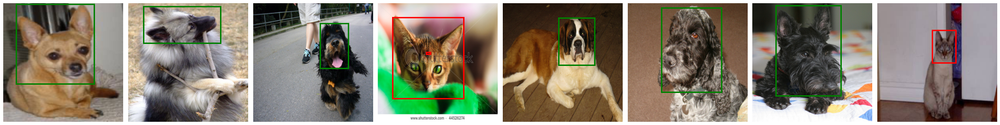

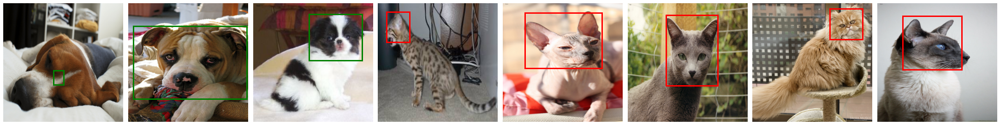

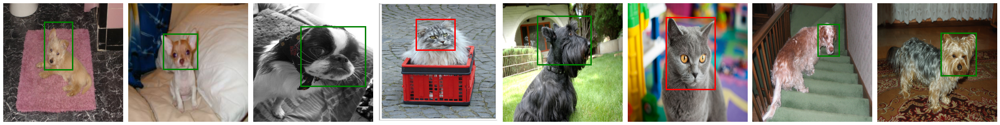

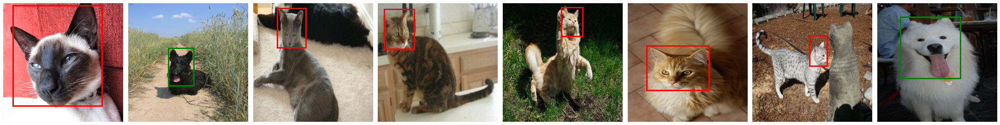

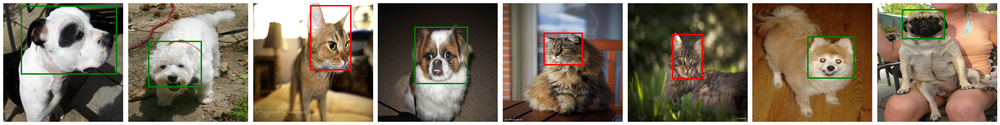

...

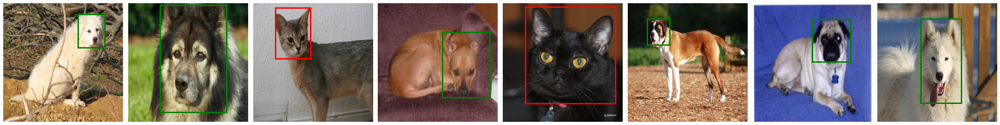

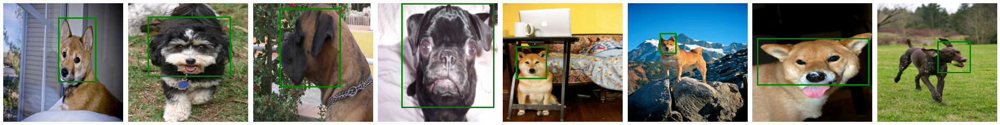

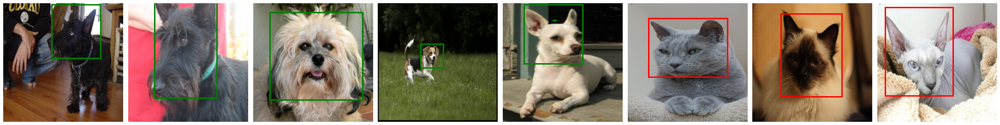

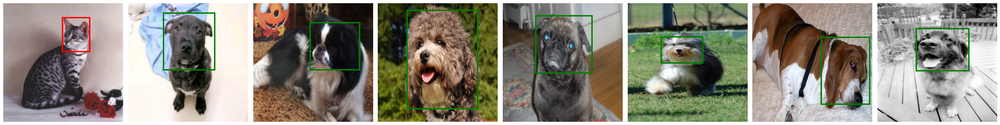

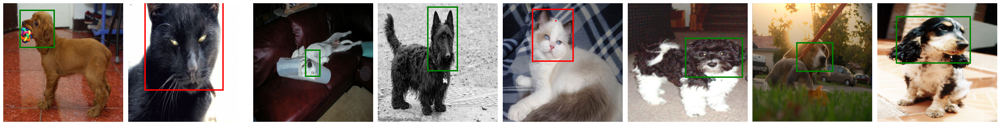

In [16]:
model.eval()

for i, (imgs, labels) in enumerate(test_dataloader):
    imgs = imgs.to(device)
    preds = model(imgs)
    res_boxes = cellboxes_to_boxes(preds)
    all_boxes = []
    for idx in range(imgs.shape[0]):
        nms_boxes = non_max_suppression(
            res_boxes[idx],
            iou_threshold=0.5,
            threshold=0.4,
            box_format='midpoint',
        )
        all_boxes.append(nms_boxes)
        if (idx+1) % 8 == 0:
            show_grid_imgs(imgs[idx-7:idx+1].to("cpu"), all_boxes, 8)
            all_boxes = []

In [17]:
torch.save(model,"catndogdetection1.pth")